In [1]:
from __future__ import print_function
from skimage.feature import peak_local_max
from skimage.morphology import watershed
from scipy import ndimage
import argparse
import imutils
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2


In [2]:
# Display two images
def display(a, b, title1 = "Original", title2 = "Edited"):
    plt.subplot(121), plt.imshow(a), plt.title(title1)
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(b), plt.title(title2)
    plt.xticks([]), plt.yticks([])
    plt.show()

# Display one image
def display_one(a, title1 = "Original"):
    plt.imshow(a), plt.title(title1)
    plt.show()


# Object Detection from Trained Model

In [3]:
#Pretrained model for person detection and no pre-processing accuracy

from imageai.Detection import ObjectDetection
import os

execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
custom_objects = detector.CustomObjects(person=True, car=False)
detections = detector.detectCustomObjectsFromImage(input_image=os.path.join(execution_path , "crossing.jpg"), output_image_path=os.path.join(execution_path , "image_new.png"), custom_objects=custom_objects, minimum_percentage_probability=60)


Using TensorFlow backend.


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_1:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_2:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_3:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_4:0' shape=(9, 4) dtype=float32> anchors
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



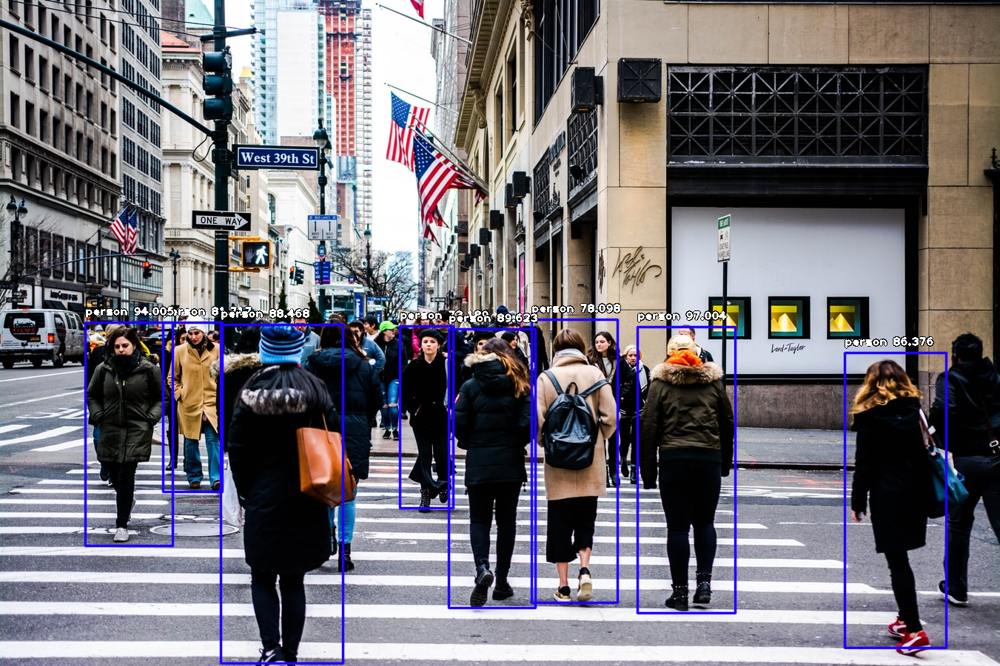

In [4]:
from IPython.display import Image
Image("image_new.png")

#  Simple Image Pre-processing Techniques to improve Object Detection by a trained ML Model

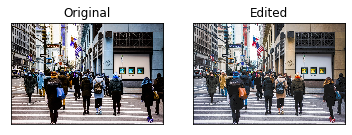

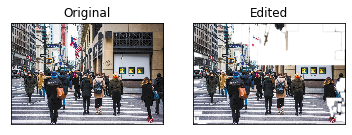

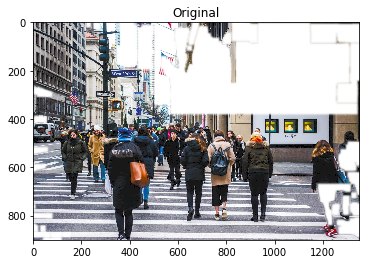

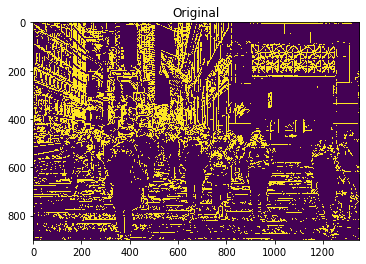

True

In [5]:
# Preprocessing Image for better Object Detection


img_file = './crossing.jpg'
img = cv2.imread(img_file, cv2.IMREAD_COLOR)

#histogram equalization

img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
img_orig = img_lab.copy()
img_lab[:,:,0]= cv2.equalizeHist(img_lab[:,:,0])
img_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)
display(img,img_rgb)


# background noise removal

gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

#edge detection, find contours

edges = cv2.Canny(gray, 100, 200)
edges = cv2.dilate(edges, None)
edges = cv2.erode(edges, None)

contour_info = []
image,contours,heir = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

for c in contours:
    contour_info.append((
        c,
        cv2.isContourConvex(c),
        cv2.contourArea(c),   
    ))
contour_info = sorted(contour_info,key = lambda c: c[2], reverse=True)
max_contour = contour_info[0]

#smoothing,blurring,blending

mask = np.zeros(edges.shape)
cv2.fillConvexPoly(mask, max_contour[0], (255))

mask = cv2.dilate(mask, None, iterations = 10)
mask = cv2.erode(mask,None, iterations = 10)
mask = cv2.GaussianBlur(mask, (21,21),0)
mask_stack = np.dstack([mask]*3)

mask_stack = mask_stack.astype('float32')/255.0
img_masked = img_rgb.astype('float32')/255.0

masked = (mask_stack * img_rgb) + ((1 - mask_stack)*(0.0,0.0,1.0)) #blending
masked = (masked*255).astype('uint8')

#check original, processed

c_red,c_green,c_blue = cv2.split(img_masked)
img_a = cv2.merge((c_red,c_green,c_blue, mask.astype('float32') / 255.0))
display(img_rgb, img_a)
display_one(img_a)
display_one(edges)

cv2.imwrite("img_prepro.jpg",img_a.astype('float32')*255)




In [6]:
#object detection after image pre-processing

from imageai.Detection import ObjectDetection
import os

execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
custom_objects = detector.CustomObjects(person=True, car=False)
detections = detector.detectCustomObjectsFromImage(input_image=os.path.join(execution_path , "img_prepro.jpg"), output_image_path=os.path.join(execution_path , "image_new_final.png"), custom_objects=custom_objects, minimum_percentage_probability=60)


tracking <tf.Variable 'Variable_5:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_6:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_7:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_8:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_9:0' shape=(9, 4) dtype=float32> anchors


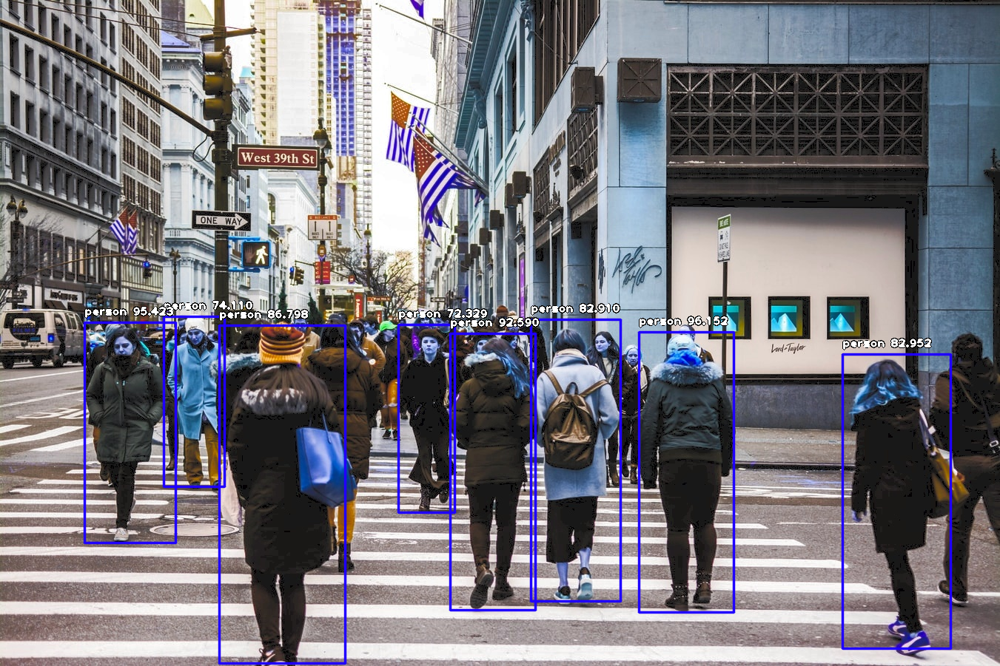

In [7]:
from IPython.display import Image
Image("image_new_final.png")

# Background Substraction to improve Object Detection by a trained ML Model

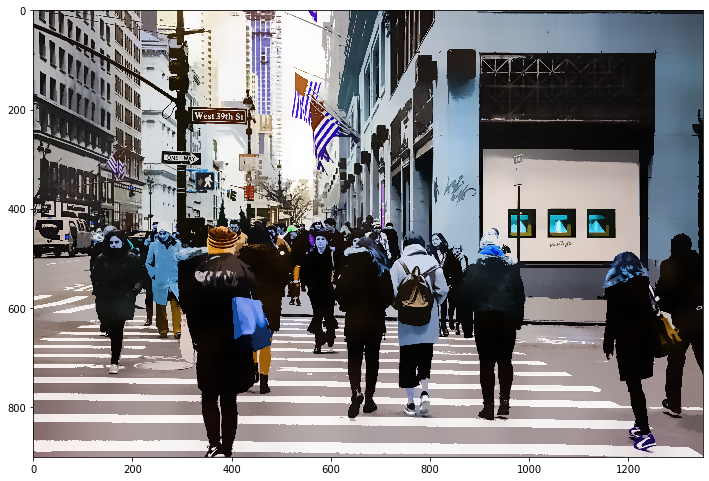

In [8]:
#Background Substractor Implementation

#https://docs.opencv.org/master/d1/dc5/tutorial_background_subtraction.html

img_file = './crossing.jpg'
img = cv2.imread('crossing.jpg')

shifted = cv2.pyrMeanShiftFiltering(img, 21, 61)

plt.figure(figsize=(12, 9))
plt.imshow(shifted)


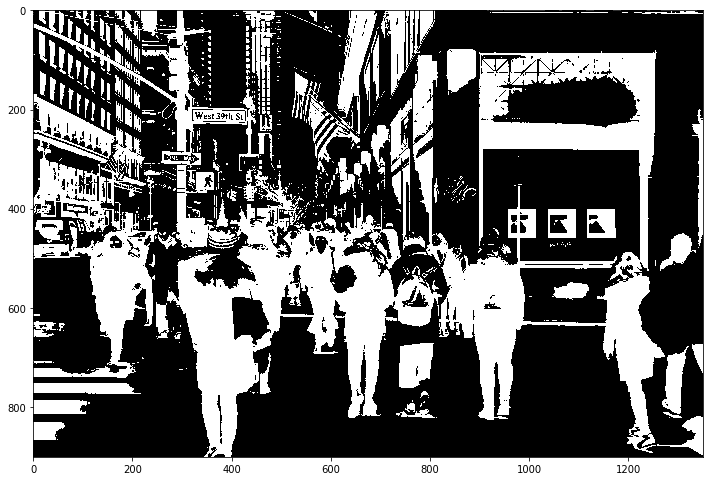

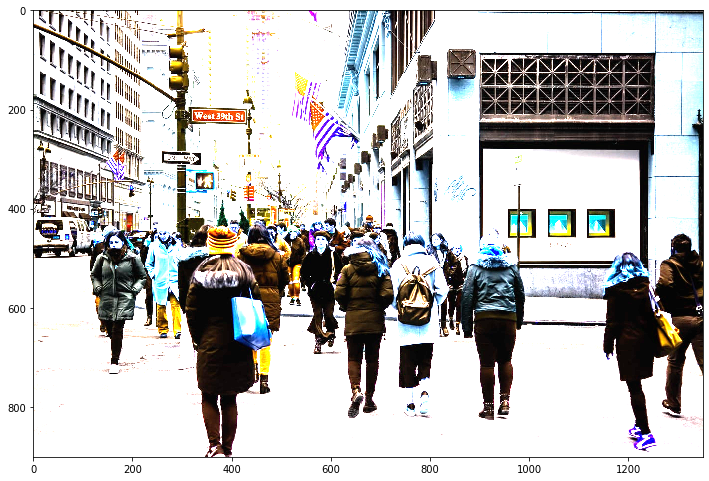

In [9]:
img_gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)

thresh = cv2.adaptiveThreshold(img_gray.astype('uint8'), 255, cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY, 199, 35) 
  
fgbg = cv2.createBackgroundSubtractorMOG2() 

 
fgmask = fgbg.apply(thresh)

img_new = cv2.addWeighted(np.stack((fgmask,)*3,axis=2),0.01,img,3,0)
#img_new = img - cv2.bitwise_or(np.stack((fgmask,)*3,axis=2),img)
#img_new = np.stack((img_new,)*3,axis=2)

plt.figure(figsize=(12, 9))
plt.imshow(fgmask, cmap = 'gray')

plt.figure(figsize=(12, 9))
plt.imshow(img_new)



In [10]:
contour_info = []
image,contours,heir = cv2.findContours(fgmask, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

for c in contours:
    contour_info.append((
        c,
        cv2.isContourConvex(c),
        cv2.contourArea(c),   
    ))
contour_info = sorted(contour_info,key = lambda c: c[2], reverse=True)
max_contour = contour_info[0]

#smoothing,blurring,blending

fmask = np.zeros(fgmask.shape)
cv2.fillConvexPoly(fmask, max_contour[0], (255))

fmask = cv2.dilate(fmask, None, iterations = 10)
fmask = cv2.erode(fmask,None, iterations = 10)
fmask = cv2.GaussianBlur(fmask, (21,21),0)
fmask_stack = np.dstack([fmask]*3)

#img_new = np.stack((img_new,img_new,img_new),axis = 2)

fmask_stack = fmask_stack.astype('float32')/255.0
img_fmasked = img_new.astype('float32')/255.0


fmasked = (fmask_stack * img_new) + ((1 - fmask_stack)*(0.0,0.0,1.0)) #blending
fmasked = (fmasked*255).astype('uint8')

#check original, processed

c_red,c_green,c_blue = cv2.split(img_fmasked)
img_b = cv2.merge((c_red,c_green,c_blue, fmask.astype('float32') / 255.0))

cv2.imwrite("img_prepro_2.jpg",img_b.astype('float32')*255)

True

In [11]:
#object detection after image pre-processing

from imageai.Detection import ObjectDetection
import os

execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
custom_objects = detector.CustomObjects(person=True, car=False)
detections = detector.detectCustomObjectsFromImage(input_image=os.path.join(execution_path , "img_prepro_2.jpg"), output_image_path=os.path.join(execution_path , "image_new_final_2.png"), custom_objects=custom_objects, minimum_percentage_probability=60)


tracking <tf.Variable 'Variable_10:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_11:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_12:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_13:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_14:0' shape=(9, 4) dtype=float32> anchors


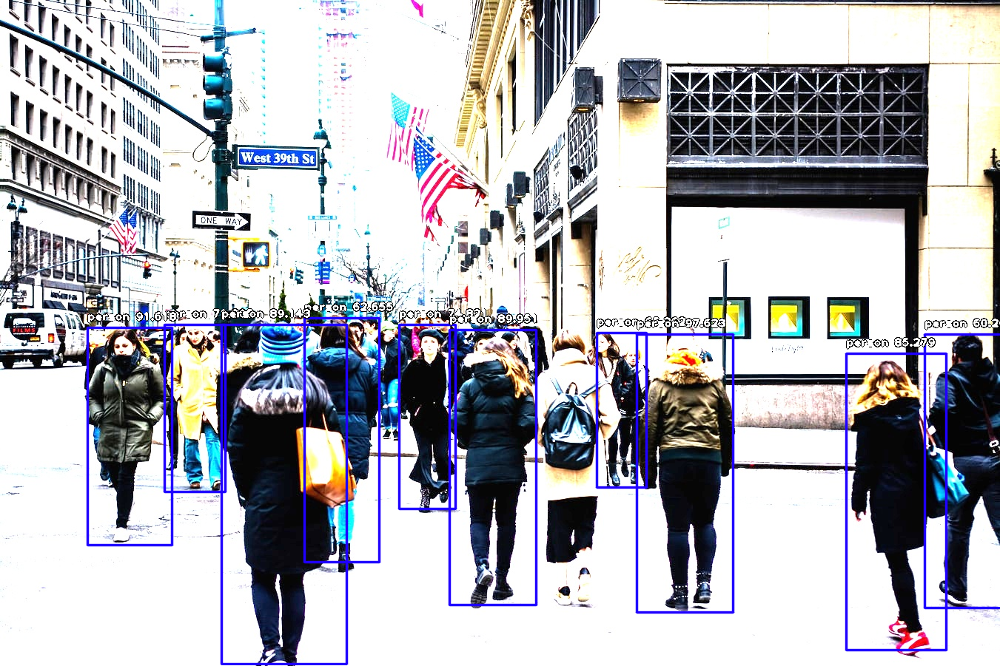

In [12]:
from IPython.display import Image
Image("image_new_final_2.png")

# Image Segmentation to improve Object Detection in overlapping/touching objects

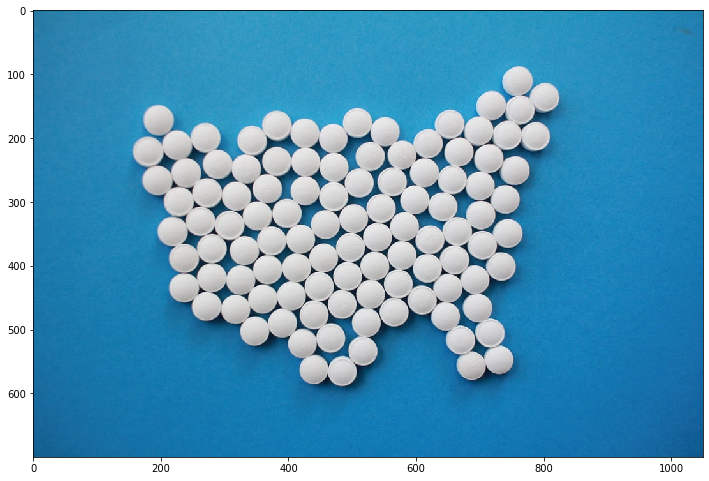

In [13]:
# load the image and perform pyramid mean shift filtering
# to aid the thresholding step

#https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_watershed/py_watershed.html

img_file_2 = './pills.jpg' #https://unsplash.com/photos/rtmUqEq4YAs
image = cv2.imread(img_file_2, cv2.IMREAD_COLOR)
shifted = cv2.pyrMeanShiftFiltering(image, 31, 61)
plt.figure(figsize=(12, 9))
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))

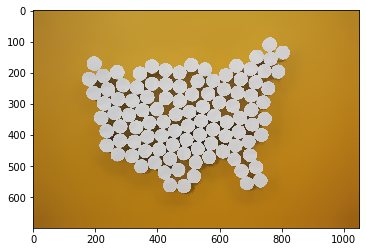

In [14]:
# convert the mean shift image to grayscale, then apply
# Otsu's thresholding
gray = cv2.cvtColor(shifted, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
plt.imshow(shifted)

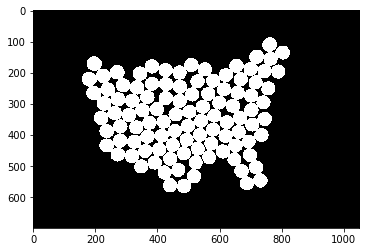

In [15]:
plt.imshow(thresh, cmap = ('gray'))

1 contour(s) detected


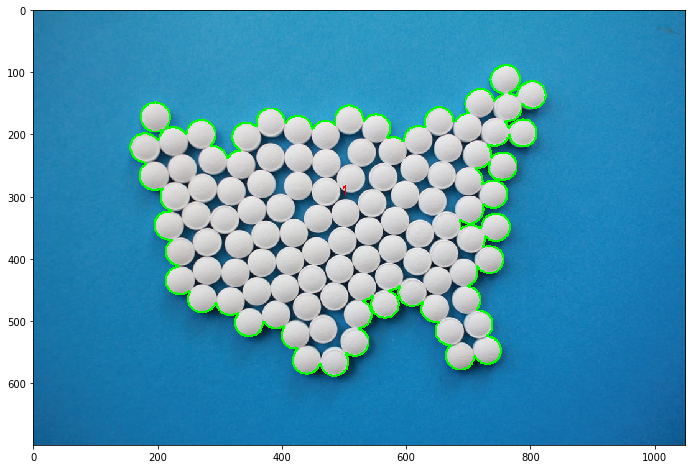

In [16]:
# find contours in the thresholded image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
cnts = imutils.grab_contours(cnts)
print("{} contour(s) detected".format(len(cnts)))
# loop over the contours
for (i, c) in enumerate(cnts):
    # draw the contour
    ((x, y), _) = cv2.minEnclosingCircle(c)
    cv2.putText(image, "{}".format(i + 1), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    cv2.drawContours(image, [c], -1, (0, 255, 0), 2)

# show the output image
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))


105 segments detected


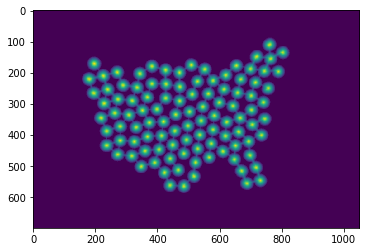

In [17]:
# compute the exact Euclidean distance from every binary
# pixel to the nearest zero pixel, then find peaks in this
# distance map

dmap = ndimage.distance_transform_edt(thresh.copy())
localMax = peak_local_max(dmap, indices=False, min_distance=10,labels=thresh)

# perform a connected component analysis on the local peaks,
# using 8-connectivity, then appy the Watershed algorithm

markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dmap, markers, mask=thresh)
print("{} segments detected".format(len(np.unique(labels)) - 1))
plt.imshow(dmap)

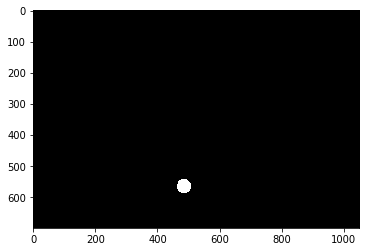

In [18]:
# loop over the unique labels returned by the Watershed
# algorithm
for label in np.unique(labels):
    # if the label is zero, we are examining the 'background'
    # so simply ignore it
    if label == 0:
        continue
    # otherwise, allocate memory for the label region and draw
    # it on the mask
    mask = np.zeros(gray.shape, dtype="uint8")
    mask[labels == label] = 255
    
    # detect contours in the mask and grab the largest one
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    # draw a circle enclosing the object
    ((x, y), r) = cv2.minEnclosingCircle(c)
    cv2.circle(image, (int(x), int(y)), int(r), (0, 255, 0), 2)
    cv2.putText(image, "{}".format(label), (int(x) - 10, int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

    
# show the mask
plt.imshow(mask, cmap = 'gray')

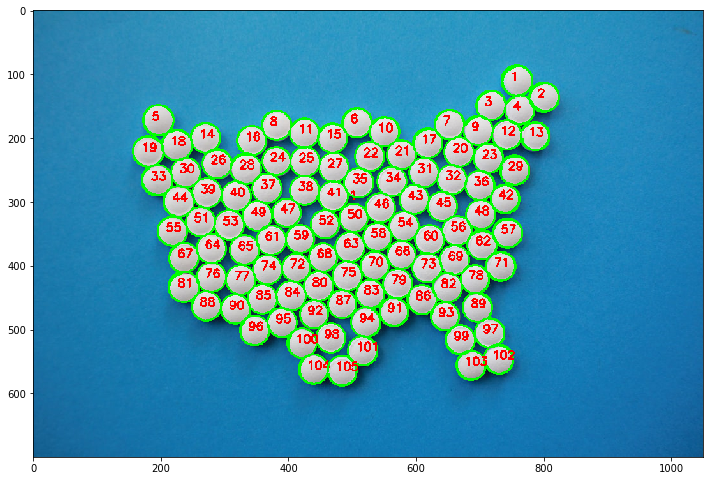

In [19]:
# show the output image
plt.figure(figsize=(12, 9))
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))